# 비지도 학습(Unsupervised Learning)

## PCA(Principal Component Analysis) - 주성분 분석 : MNIST 데이터셋

In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

- 다음으로 MNIST 데이터셋을 로드한다. PCA를 사용해 차원 축소를 수행하고 있으므로 테스트 데이터셋이나 레이블은 필요 없다.
- 그러나 차원 축소 후 PCA성능을 확인할 수 있도록 레이블을 로드한다.
- PCA는 하나의 클러스터에서 유사한 데이터 포인트를 군집화해야 하므로 PCA를 사용해 형성된 클러스터가 레이블과 유사하다면 PCA가 작동하고 있다는 것을 나타낸다.

In [9]:
((x_train, y_train), (_, _)) = tf.keras.datasets.mnist.load_data()

# 0-1 사이로 정규화
x_train = x_train / 255.
x_train = x_train.astype(np.float32)

x_train = np.reshape(x_train, (x_train.shape[0], 784))
print("x_train shape:", x_train.shape)

mean = x_train.mean(axis = 1)
print("mean shape:", mean.shape)

x_train = x_train - mean[:, None]

x_train shape: (60000, 784)
mean shape: (60000,)


In [10]:
s, u, v = tf.linalg.svd(x_train)
print(s.shape)
s = tf.linalg.diag(s)
print(s.shape, u.shape, v.shape)

(784,)
(784, 784) (60000, 784) (784, 784)


In [12]:
k = 3
pca = tf.matmul(u[:,0:k], s[0:k,0:k])
print('original data shape:', x_train.shape)
print('reduced data shape:', pca.shape)

original data shape: (60000, 784)
reduced data shape: (60000, 3)


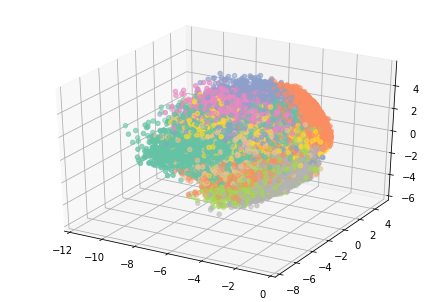

In [14]:
Set = sns.color_palette('Set2', 10)
color_mapping = {key:value for (key,value) in enumerate(Set)}
colors = list(map(lambda x: color_mapping[x], y_train))
fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(pca[:, 0], pca[:, 1], pca[:, 2], c=colors)

## k-평균(kmeans or hard clustering) 군집화 예제(텐서플로2.0)
- 텐서플로에서의 k-평균을 구현하고자 다음 코드에서는 무작위로 생성된 데이터를 사용한다.
- 무작위로 생성된 데이터는 200개의 샘플리 포함되고 3개의 클러스터로 나뉜다.
- 늘 그렇듯 필요한 모듈을 임포트하고 변수를 정의하며 샘플 포인트수(points_n), 형성할 클러스터 수(clusters_n), 수행 반복 횟수(iteration_n)를 결정한다.
- 또한 작업이 재현 가능하도록 난수 시드를 설정

In [17]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

points_n = 200
clusters_n = 3
iteration_n = 100
np.random.seed(123)
tf.random.set_seed(123)

In [18]:
points = np.random.uniform(0, 10, (points_n, 2))
centroids = tf.slice(tf.random.shuffle(points), [0,0], [clusters_n, -1])

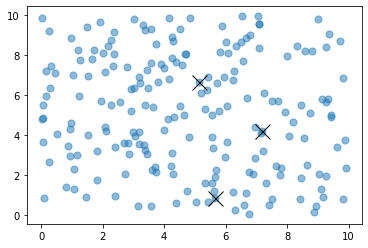

In [19]:
plt.scatter(points[:,0], points[:,1], s=50, alpha=0.5)
plt.plot(centroids[:,0], centroids[:,1], 'kx', markersize=15)
plt.show()

- 사용자 정의 함수 closest_centroids() 를 정의해 각 포인트를 가장 근접한 센트로이드에 할당한다.
- 또 다른 사용자 정의 함수 move_centroids() 를 정의해 제곱 거리가 감소하도록 센트로이드를 재계산한다.

In [20]:
def closest_centroids(points, centroids):
    distance = tf.reduce_sum(tf.square(tf.subtract(points, centroids[:,None])), 2)
    assignment = tf.argmin(distance, 0)
    return assignment

def move_centroids(points, closest, centroids):
    return np.array([points[closest==k].mean(axis=0) for k in range(centroids.shape[0])])

In [22]:
for step in range(iteration_n):
    print("step to {:d}/{:d}".format(step + 1, iteration_n))
    closest = closest_centroids(points, centroids)
    centroids = move_centroids(points, closest, centroids)

step to 1/100
step to 2/100
step to 3/100
step to 4/100
step to 5/100
step to 6/100
step to 7/100
step to 8/100
step to 9/100
step to 10/100
step to 11/100
step to 12/100
step to 13/100
step to 14/100
step to 15/100
step to 16/100
step to 17/100
step to 18/100
step to 19/100
step to 20/100
step to 21/100
step to 22/100
step to 23/100
step to 24/100
step to 25/100
step to 26/100
step to 27/100
step to 28/100
step to 29/100
step to 30/100
step to 31/100
step to 32/100
step to 33/100
step to 34/100
step to 35/100
step to 36/100
step to 37/100
step to 38/100
step to 39/100
step to 40/100
step to 41/100
step to 42/100
step to 43/100
step to 44/100
step to 45/100
step to 46/100
step to 47/100
step to 48/100
step to 49/100
step to 50/100
step to 51/100
step to 52/100
step to 53/100
step to 54/100
step to 55/100
step to 56/100
step to 57/100
step to 58/100
step to 59/100
step to 60/100
step to 61/100
step to 62/100
step to 63/100
step to 64/100
step to 65/100
step to 66/100
step to 67/100
step

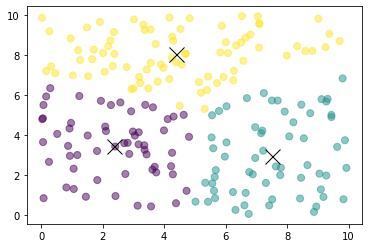

In [24]:
plt.scatter(points[:,0], points[:,1], c=closest, s=50, alpha=0.5)
plt.plot(centroids[:,0], centroids[:,1], 'kx', markersize=15)
plt.show()

- k-평균 변형(fuzzy clustering or soft clustering) [J.C.Dunn, J.C.Bezdek] : 하나의 포인트가 모든 클러스터에 속하게 할 수 있고, 멤버십 함수를 통해 특정 클러스터(중심점)에 몇 개의 포인트가 속하게 할지 정의할 수 있다.
- 가속 k-평균 알고리즘 [Charles Elkan] : 삼각 부등식(삼각형의 두 변의 길이는 한 변보다 항상 길다. 즉, 직선이 두 점 사이의 최단거리라는 뜻)을 이용했다. 각 반복에서 모든 거리 계산을 수행하는 대신 점과 중심사이의 거리에 대한 하한과 상한도 추적했다.
- k-평균 ++ 알고리즘 [David Arthur, Sergei Vassilvitskii] : 서로 떨어진 센트로이드를 선택하면 k-평균 알고리즘이 차선으로 수렴할 가능성이 적다는 것을 보여줬다. 주요한 변화는 센트로이드 초깃값에 있다.

## 자체 구성 맵(SOM, Self-Organized Maps) - 코호넨(Kohonen)신경망 or 승자 독식 유닛(WTU, Winner Take all Units)

In [26]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

In [52]:
# 승자 독식 유닛 정의
class WTU(object):

    #_learned = False
    def __init__(self, m, n, dim, num_iterations, eta=0.5, sigma=None):
        '''
        m x n : 뉴런이 정렬될 2D 격자의 차원
        dim : 입력 훈련 데이터 차원
        num_iterations : 전체 훈련 반복 횟수
        eta : 학습률
        sigma : 인접 함수 반경
        '''
        self._m = m
        self._n = n
        self._neighbourhood = []
        self._topography = []
        self._num_iterations = int(num_iterations)
        self._learned = False
        self._dim = dim

        self.eta = float(eta)
        if sigma is None:
            sigma = max(m,n)/2.0  # Constant radius
        else:
            sigma = float(sigma)
        self.sigma = sigma

        print('Network created with dimensions',m,n)

        # 가중치 행렬과 뉴런의 위상
        self._W = tf.random.normal([m*n, dim], seed=0)
        self._topography = np.array(list(self._neuron_location(m,n)))
    
    # 이 클래스 에서 제일 중요한 함수는 이 training() 함수이다.
    # 이 함수는 앞서 설명한 코호넨 알고리즘(승자 독식 유닛)을 사용해 승자 유닛을 찾고
    # 인접 함수에 기반을 두고 가중치를 갱신한다.
    def training(self, x, i):
        m = self._m
        n = self._n

        # 승자와 위치를 찾는다.
        d = tf.sqrt(tf.reduce_sum(tf.pow(self._W - tf.stack([x for i in range(m*n)]), 2), 1))
        self.WTU_idx = tf.argmin(d,0)

        slice_start = tf.pad(tf.reshape(self.WTU_idx, [1]), np.array([[0,1]]))
        self.WTU_loc = tf.reshape(tf.slice(self._topography, slice_start, [1,2]), [2])

        # 학습률과 반경을 반복에 대한 함수로 변경한다.
        learning_rate = 1 - i/self._num_iterations
        _eta_new = self.eta * learning_rate
        _sigma_new = self.sigma * learning_rate

        # 인접 함수 계산
        distance_square = tf.reduce_sum(tf.pow(tf.subtract(
            self._topography, tf.stack([self.WTU_loc for i in range(m*n)])
        ), 2), 1)
        neighbourgood_func = tf.exp(tf.negative(tf.math.divide(tf.cast(
            distance_square, 'float32'
        ), tf.pow(_sigma_new, 2))))

        # 학습률을 인접 함수와 곱한다.
        eta_into_Gamma = tf.multiply(_eta_new, neighbourgood_func)

        # dW를 구하고자 곱할 수 있도록 형태를 맞춘다.
        weight_multiplier = tf.stack([
            tf.tile(tf.slice(eta_into_Gamma, np.array([i]), np.array([1])), [self._dim]) for i in range(m*n)
        ])
        delta_W = tf.multiply(weight_multiplier, tf.subtract(tf.stack([x for i in range(m*n)]), self._W))
        new_W = self._W + delta_W
        self._W = new_W
    
    # fit() 함수는 training() 함수를 호출하고 센트로이드 추출이 용이하도록 저장하는 헬퍼 함수다.
    def fit(self, X):
        '''
        훈련 수행 함수
        '''
        for i in range(self._num_iterations):
            print('Training to {:d}/{:d}'.format(i + 1, self._num_iterations))
            for x in X:
                self.training(x,i)
        print('='*10,'Training of %d times have been Completed' %self._num_iterations,'='*10)

        # 추출이 용이하도록 센트로이드 그리드 저장
        centroid_grid = [[] for i in range(self._m)]
        self._Wts = list(self._W)
        self._locations = list(self._topography)
        for i, loc in enumerate(self._locations):
            centroid_grid[loc[0]].append(self._Wts[i])
        self._centroid_grid = centroid_grid
        self._learned = True
    
    # 이 함수는 승자를 찾고 2D 뉴런 격자를 생성할 더 많은 헬퍼 함수와 입력 벡터를 2D 격자의 해당 뉴런으로 매핑하는 함수다.
    def winner(self, x):
        idx = self.WTU_idx, self.WTU_loc
        return idx
    
    # 이 
    def _neuron_location(self, m, n):
        '''
        뉴런의 2D 격자 생성 함수
        '''
        for i in range(m):
            for j in range(n):
                yield np.array([i,j])
    
    def get_centroids(self):
        """
        'm' 리스트를 반환하는 함수, 각 내부 리스트에는
        'n' 해당 센트로이드 위치를 1-D NumPy 배열로 갖고 있다.
        """
        if not self._learned:
            raise ValueError('SOM not trained yet')
        return self._centroid_grid
    
    def map_vects(self, X):
        '''
        각 입력 벡터를 격자의 연관 뉴런과 매칭하는 함수
        '''
        if not self._learned:
            raise ValueError('SOM not trained yet')
            
        to_return = []
        for vect in X:
            min_index = min([i for i in range(len(self._Wts))],
                            key=lambda x: np.linalg.norm(vect - self._Wts[x]))
            to_return.append(self._locations[min_index])
        return to_return

- 입력 데이터를 정규화해야 하므로 이를 수행하는 함수를 만들어야 한다.

In [33]:
def normalize(df):
    result = df.copy()
    for feature_name in df.columns:
        max_value = df[feature_name].max()
        min_value = df[feature_name].min()
        result[feature_name] = (df[feature_name] - min_value) / (max_value - min_value)
    return result.astype(np.float32)

In [34]:
# 데이터 로드
import pandas as pd

df = pd.read_csv('datasets/colors.csv')  # 데이터셋의 마지막 열은 레이블이다.
df.head()
data = normalize(df[['R','G','B']]).values
name = df['Color-Name'].values
n_dim = len(df.columns) - 1

# 훈련 데이터
colors = data
color_names = name

In [44]:
# SOM을 생성하고 적합화
som = WTU(30, 30, n_dim, 400, sigma=10.0)
som.fit(colors)

Network created with dimensions 30 30
Training to 1/400
Training to 2/400
Training to 3/400
Training to 4/400
Training to 5/400
Training to 6/400
Training to 7/400
Training to 8/400
Training to 9/400
Training to 10/400
Training to 11/400
Training to 12/400
Training to 13/400
Training to 14/400
Training to 15/400
Training to 16/400
Training to 17/400
Training to 18/400
Training to 19/400
Training to 20/400
Training to 21/400
Training to 22/400
Training to 23/400
Training to 24/400
Training to 25/400
Training to 26/400
Training to 27/400
Training to 28/400
Training to 29/400
Training to 30/400
Training to 31/400
Training to 32/400
Training to 33/400
Training to 34/400
Training to 35/400
Training to 36/400
Training to 37/400
Training to 38/400
Training to 39/400
Training to 40/400
Training to 41/400
Training to 42/400
Training to 43/400
Training to 44/400
Training to 45/400
Training to 46/400
Training to 47/400
Training to 48/400
Training to 49/400
Training to 50/400
Training to 51/400
Tr

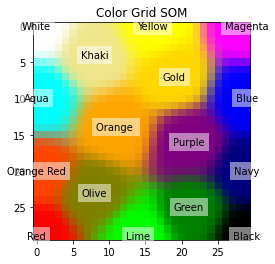

In [45]:
# 출력 그리드 구하기
image_grid = som.get_centroids()

# 색상을 최근접 뉴런에 매핑
mapped = som.map_vects(colors)

# 도식화
plt.imshow(image_grid)
plt.title('Color Grid SOM')
for i, m in enumerate(mapped):
    plt.text(m[1], m[0], color_names[i], ha='center', va='center', bbox=dict(facecolor='white', alpha=0.5, lw=0))

In [53]:
test = WTU(30, 30, n_dim, 3, sigma=10.0)
test.fit(colors)

Network created with dimensions 30 30
Training to 1/3
Training to 2/3
Training to 3/3
========== Training of 3 times have been Completed ==========


## 제한된 볼츠만 머신(Restricted Boltzmann_Machines) - MNIST 예제

In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

In [6]:
# RBm 작동을 정의하는 클래스
class RBM(object):
    def __init__(self, input_size, output_size, lr=1.0, batchsize=100):
        '''
        m: 가시층의 뉴런개수
        n: 은닉층의 뉴런개수
        '''
        # 초매개변수 정의
        self._input_size = input_size  # 입력 크기
        self._output_size = output_size  # 출력 크기
        self.learning_rate = lr  # 그래디언트 하강 단계(학습률)
        self.batchsize = batchsize
        # 각 부분 반복에서 사용할 훈련 데이터 수
        # 가중치와 편향 행렬을 모두 0으로 초기화
        # 가중치를 생성하고 0으로 초기화
        self.w = tf.zeros([input_size, output_size], np.float32)
        # 은닉 편향을 생성하고 0으로 초기화
        self.hb = tf.zeros([output_size], np.float32)
        # 가시 편향을 생성하고 0으로 초기화
        self.vb = tf.zeros([input_size], np.float32)
    
    # 순방향 경로
    def prob_h_given_v(self, visible, w, hb):
        # 시그모이드
        return tf.nn.sigmoid(tf.matmul(visible, w) + hb)

    # 역방향 경로
    def prob_v_given_h(self, hidden, w, vb):
        return tf.nn.sigmoid(tf.matmul(hidden, tf.transpose(w)) + vb)

    # 샘플 확률 생성
    def sample_prob(self, probs):
        return tf.nn.relu(tf.sign(probs - tf.random.uniform(tf.shape(probs))))

    def rbm_reconstruct(self, X):
        h = tf.nn.sigmoid(tf.matmul(X, self.w) + self.hb)
        reconstruct = tf.nn.sigmoid(tf.matmul(h, tf.transpose(self.w)) + self.vb)
        return reconstruct

    # 모델의 훈련 메소드
    def train(self, X, epochs=10):
        loss = []
        for epoch in range(epochs):
            # 각 단계 / 배치에 대해
            for start, end in zip(range(0, len(X), self.batchsize), range(self.batchsize, len(X), self.batchsize)):
                batch = X[start:end]
                # 표본 확률 초기화
                h0 = self.sample_prob(self.prob_h_given_v(batch, self.w, self.hb))
                v1 = self.sample_prob(self.prob_v_given_h(h0, self.w, self.vb))
                h1 = self.prob_h_given_v(v1, self.w, self.hb)

                # 그래디언트 생성
                positive_grad = tf.matmul(tf.transpose(batch), h0)
                negative_grad = tf.matmul(tf.transpose(v1), h1)

                # 학습률 갱신
                self.w = self.w + self.learning_rate * (positive_grad - negative_grad) / tf.dtypes.cast(tf.shape(batch)[0], tf.float32)
                self.vb = self.vb + self.learning_rate * tf.reduce_mean(batch - v1, 0)
                self.hb = self.hb + self.learning_rate * tf.reduce_mean(h0 - h1, 0)

            # 오차율 구하기
            err = tf.reduce_mean(tf.square(batch - v1))
            print('Epoch: %d' %epoch, 'reconstruction error: %f' %err)
            loss.append(err)
        return loss

In [7]:
(train_data, _), (test_data, _) = tf.keras.datasets.mnist.load_data()
train_data = train_data / np.float32(255)
train_data = np.reshape(train_data, (train_data.shape[0], 784))

test_data = test_data / np.float32(255)
test_data = np.reshape(test_data, (test_data.shape[0], 784))

#noise = 0.5
#train_noisy = train_data + noise * np.random.normal(loc=0.0, scale=1.0, size=x_train.shape)
#test_noisy = test_data + noise * np.random.normal(loc=0.0, scale=1.0, size=x_test.shape)

#train_noisy = np.clip(x_train_noisy, 0, 1)
#test_noisy = np.clip(x_test_noisy, 0, 1)

# 입력 크기는 훈련 집합에서의 입력 개수다.
input_size = train_data.shape[1]
rbm = RBM(input_size, 200)

err = rbm.train(train_data, 50)

Epoch: 0 reconstruction error: 0.056787
Epoch: 1 reconstruction error: 0.052253
Epoch: 2 reconstruction error: 0.048926
Epoch: 3 reconstruction error: 0.049202
Epoch: 4 reconstruction error: 0.047144
Epoch: 5 reconstruction error: 0.046305
Epoch: 6 reconstruction error: 0.044204
Epoch: 7 reconstruction error: 0.044319
Epoch: 8 reconstruction error: 0.044150
Epoch: 9 reconstruction error: 0.043668
Epoch: 10 reconstruction error: 0.042973
Epoch: 11 reconstruction error: 0.043416
Epoch: 12 reconstruction error: 0.043397
Epoch: 13 reconstruction error: 0.043992
Epoch: 14 reconstruction error: 0.042448
Epoch: 15 reconstruction error: 0.042487
Epoch: 16 reconstruction error: 0.042850
Epoch: 17 reconstruction error: 0.043052
Epoch: 18 reconstruction error: 0.042967
Epoch: 19 reconstruction error: 0.041321
Epoch: 20 reconstruction error: 0.041799
Epoch: 21 reconstruction error: 0.041839
Epoch: 22 reconstruction error: 0.041182
Epoch: 23 reconstruction error: 0.040735
Epoch: 24 reconstruction e

Text(0, 0.5, 'cost')

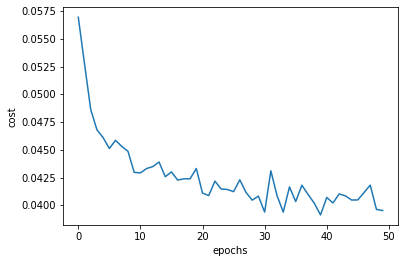

In [7]:
# 학습 곡선(loss)을 도식화
plt.plot(err)
plt.xlabel('epochs')
plt.ylabel('cost')

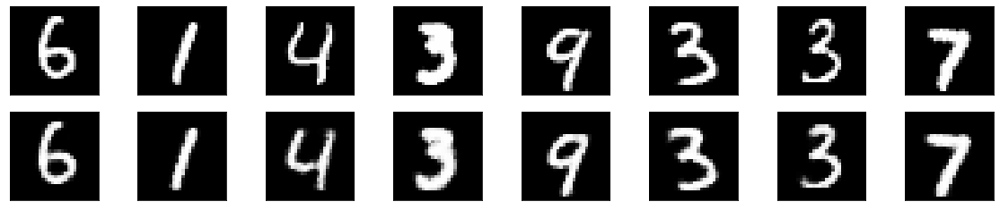

In [10]:
out = rbm.rbm_reconstruct(test_data)

# 원래와 재구성된 이미지 표시
row, col = 2, 8
idx = np.random.randint(0, 100, row * col // 2)
f, axarr = plt.subplots(row, col, sharex=True, sharey=True, figsize=(20, 4))
for fig, row in zip([test_data, out], axarr):
    for i, ax in zip(idx, row):
        ax.imshow(tf.reshape(fig[i], [28, 28]), cmap='Greys_r')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

In [16]:
(train_data, _), (test_data, _) = tf.keras.datasets.mnist.load_data()
train_data = train_data / np.float32(255)
train_data = np.reshape(train_data, (train_data.shape[0], 784))

test_data = test_data / np.float32(255)
test_data = np.reshape(test_data, (test_data.shape[0], 784))

noise = 0.5
train_noisy = train_data + noise * np.random.normal(loc=0.0, scale=1.0, size=train_data.shape)
test_noisy = test_data + noise * np.random.normal(loc=0.0, scale=1.0, size=test_data.shape)

train_noisy = np.clip(train_noisy, 0, 1).astype(np.float32)
test_noisy = np.clip(test_noisy, 0, 1).astype(np.float32)

# 입력 크기는 훈련 집합에서의 입력 개수다.
input_size = train_noisy.shape[1]
rbm = RBM(input_size, 200)

err = rbm.train(train_noisy, 50)

Epoch: 0 reconstruction error: 0.290638
Epoch: 1 reconstruction error: 0.293951
Epoch: 2 reconstruction error: 0.291611
Epoch: 3 reconstruction error: 0.292116
Epoch: 4 reconstruction error: 0.290366
Epoch: 5 reconstruction error: 0.293961
Epoch: 6 reconstruction error: 0.291103
Epoch: 7 reconstruction error: 0.292972
Epoch: 8 reconstruction error: 0.293552
Epoch: 9 reconstruction error: 0.292290
Epoch: 10 reconstruction error: 0.291587
Epoch: 11 reconstruction error: 0.293812
Epoch: 12 reconstruction error: 0.294125
Epoch: 13 reconstruction error: 0.291794
Epoch: 14 reconstruction error: 0.291821
Epoch: 15 reconstruction error: 0.289385
Epoch: 16 reconstruction error: 0.287544
Epoch: 17 reconstruction error: 0.290011
Epoch: 18 reconstruction error: 0.292417
Epoch: 19 reconstruction error: 0.293487
Epoch: 20 reconstruction error: 0.290331
Epoch: 21 reconstruction error: 0.288691
Epoch: 22 reconstruction error: 0.290742
Epoch: 23 reconstruction error: 0.289379
Epoch: 24 reconstruction e

Text(0, 0.5, 'cost')

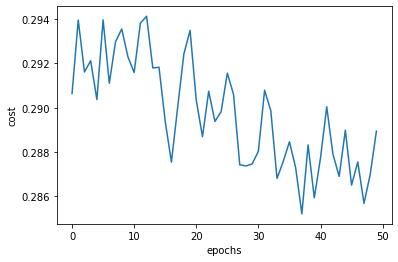

In [17]:
# 학습 곡선(loss)을 도식화
plt.plot(err)
plt.xlabel('epochs')
plt.ylabel('cost')

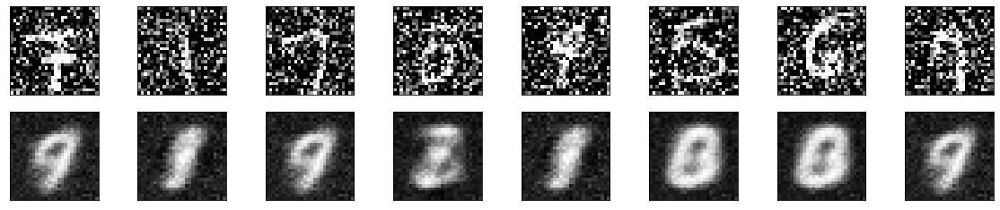

In [18]:
out = rbm.rbm_reconstruct(test_noisy)

# 원래와 재구성된 이미지 표시
row, col = 2, 8
idx = np.random.randint(0, 100, row * col // 2)
f, axarr = plt.subplots(row, col, sharex=True, sharey=True, figsize=(20, 4))
for fig, row in zip([test_noisy, out], axarr):
    for i, ax in zip(idx, row):
        ax.imshow(tf.reshape(fig[i], [28, 28]), cmap='Greys_r')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

## 심층 신뢰 신경망 DBN(Deep Belief Networks) - 스택된 RBM

In [20]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

In [8]:
# RBm 작동을 정의하는 클래스
class RBM(object):
    def __init__(self, input_size, output_size, lr=1.0, batchsize=100):
        '''
        m: 가시층의 뉴런개수
        n: 은닉층의 뉴런개수
        '''
        # 초매개변수 정의
        self._input_size = input_size  # 입력 크기
        self._output_size = output_size  # 출력 크기
        self.learning_rate = lr  # 그래디언트 하강 단계(학습률)
        self.batchsize = batchsize
        # 각 부분 반복에서 사용할 훈련 데이터 수
        # 가중치와 편향 행렬을 모두 0으로 초기화
        # 가중치를 생성하고 0으로 초기화
        self.w = tf.zeros([input_size, output_size], np.float32)
        # 은닉 편향을 생성하고 0으로 초기화
        self.hb = tf.zeros([output_size], np.float32)
        # 가시 편향을 생성하고 0으로 초기화
        self.vb = tf.zeros([input_size], np.float32)
    
    # 순방향 경로
    def prob_h_given_v(self, visible, w, hb):
        # 시그모이드
        return tf.nn.sigmoid(tf.matmul(visible, w) + hb)

    # 역방향 경로
    def prob_v_given_h(self, hidden, w, vb):
        return tf.nn.sigmoid(tf.matmul(hidden, tf.transpose(w)) + vb)

    # 샘플 확률 생성
    def sample_prob(self, probs):
        return tf.nn.relu(tf.sign(probs - tf.random.uniform(tf.shape(probs))))

    # 모델의 훈련 메소드
    def train(self, X, epochs=10):
        loss = []
        for epoch in range(epochs):
            # 각 단계 / 배치에 대해
            for start, end in zip(range(0, len(X), self.batchsize), range(self.batchsize, len(X), self.batchsize)):
                batch = X[start:end]
                # 표본 확률 초기화
                h0 = self.sample_prob(self.prob_h_given_v(batch, self.w, self.hb))
                v1 = self.sample_prob(self.prob_v_given_h(h0, self.w, self.vb))
                h1 = self.prob_h_given_v(v1, self.w, self.hb)

                # 그래디언트 생성
                positive_grad = tf.matmul(tf.transpose(batch), h0)
                negative_grad = tf.matmul(tf.transpose(v1), h1)

                # 학습률 갱신
                self.w = self.w + self.learning_rate * (positive_grad - negative_grad) / tf.dtypes.cast(tf.shape(batch)[0], tf.float32)
                self.vb = self.vb + self.learning_rate * tf.reduce_mean(batch - v1, 0)
                self.hb = self.hb + self.learning_rate * tf.reduce_mean(h0 - h1, 0)

            # 오차율 구하기
            err = tf.reduce_mean(tf.square(batch - v1))
            print('Epoch: %d' %epoch, 'reconstruction error: %f' %err)
            loss.append(err)
        return loss
    
    # DBM의 기대 출력
    def rbm_output(self, X):
        out = tf.nn.sigmoid(tf.matmul(X, self.w) + self.hb)
        return out

    def rbm_reconstruct(self, X):
        h = tf.nn.sigmoid(tf.matmul(X, self.w) + self.hb)
        reconstruct = tf.nn.sigmoid(tf.matmul(h, tf.transpose(self.w)) + self.vb)
        return reconstruct

In [21]:
(train_data, _), (test_data, _) = tf.keras.datasets.mnist.load_data()
train_data = train_data / np.float32(255)
train_data = np.reshape(train_data, (train_data.shape[0], 784))

test_data = test_data / np.float32(255)
test_data = np.reshape(test_data, (test_data.shape[0], 784))

#noise = 0.5
#train_noisy = train_data + noise * np.random.normal(loc=0.0, scale=1.0, size=x_train.shape)
#test_noisy = test_data + noise * np.random.normal(loc=0.0, scale=1.0, size=x_test.shape)

#train_noisy = np.clip(x_train_noisy, 0, 1)
#test_noisy = np.clip(x_test_noisy, 0, 1)

In [9]:
RBM_hidden_sizes = [500, 200, 50]

inpX = train_data

# RBM을 가질 리스트 생성
rbm_list = []

# 입력크기는 훈련 집합에서 입력의 개수다.
input_size = train_data.shape[1]

# 각 RBM에 대해 다음을 생성하려 한다.
for i, size in enumerate(RBM_hidden_sizes):
    print('RBM: ', i, ' ', input_size, '->', size)
    rbm_list.append(RBM(input_size, size))
    input_size = size

RBM:  0   784 -> 500
RBM:  1   500 -> 200
RBM:  2   200 -> 50


In [10]:
# 리스트의 각 RBM에 대해
for rbm in rbm_list:
    print('New RBM:')
    # 새로운 것 훈련
    rbm.train(tf.cast(inpX, tf.float32))
    # 출력 계층 반환
    inpX = rbm.rbm_output(inpX)

New RBM:
Epoch: 0 reconstruction error: 0.057991
Epoch: 1 reconstruction error: 0.054022
Epoch: 2 reconstruction error: 0.049764
Epoch: 3 reconstruction error: 0.047373
Epoch: 4 reconstruction error: 0.046461
Epoch: 5 reconstruction error: 0.045257
Epoch: 6 reconstruction error: 0.046234
Epoch: 7 reconstruction error: 0.044511
Epoch: 8 reconstruction error: 0.042932
Epoch: 9 reconstruction error: 0.044066
New RBM:
Epoch: 0 reconstruction error: 0.027850
Epoch: 1 reconstruction error: 0.024224
Epoch: 2 reconstruction error: 0.022235
Epoch: 3 reconstruction error: 0.021437
Epoch: 4 reconstruction error: 0.020487
Epoch: 5 reconstruction error: 0.020899
Epoch: 6 reconstruction error: 0.021355
Epoch: 7 reconstruction error: 0.020963
Epoch: 8 reconstruction error: 0.020318
Epoch: 9 reconstruction error: 0.020488
New RBM:
Epoch: 0 reconstruction error: 0.052043
Epoch: 1 reconstruction error: 0.050057
Epoch: 2 reconstruction error: 0.048626
Epoch: 3 reconstruction error: 0.048986
Epoch: 4 reco

## 가변 오토인코더(VAE, Variational AutoEncoders) - fashion_mnist 예제
- 가변 오토인코더는 최고의 신경망과 베이즈 추론이 혼합된 것이다.
- 비지도학습에서 가장 인기 있는 접근법 중 하나로 등장함.
- VAE는 오토인코더를 살짝 변형한 것으로 기존 인코더와 디코더 신경망과 함께 추가된 확률 계층이 있다.
- 인코더 신경망 다음에 있는 확률(stochastic)계층은 가우스 분포를 사용해 데이터를 샘플링하고 디코더 신경망 이후의 계층은 베르누이의 분포를 사용해 데이터를 샘플링한다.
- GAN과 마찬가지로 VAE는 훈련된 분포를 기반으로 이미지와 그림을 생성하는 데 사용할 수 있다.
- VAE를 사용하면 잠재적인 복잡한 사전 분포를 설정해 강력한 잠재 표현을 배울수 있다.

In [9]:
import tensorflow as tf
import numpy as np
from matplotlib import pyplot as plt

np.random.seed(333)
tf.random.set_seed(333)
assert tf.__version__.startswith('2.'), "TensorFlow Version Below 2.0"

In [2]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.fashion_mnist.load_data()
x_train, x_test = x_train.astype(np.float32)/255., x_test.astype(np.float32)/255.
print(x_train.shape, y_train.shape)
print(x_test.shape, y_test.shape)

(60000, 28, 28) (60000,)
(10000, 28, 28) (10000,)


- 몇 개의 샘플 이미지를 살펴보자.

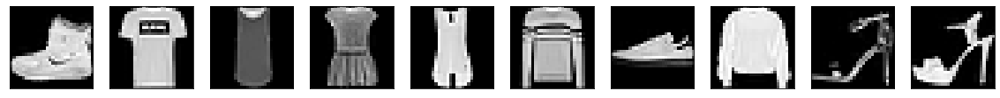

In [3]:
number = 10  # 몇 개의 숫자를 표현할 것인지 설정
plt.figure(figsize=(20,4))
for index in range(number):
    # 원시 이미지 표시
    ax = plt.subplot(2, number, index + 1)
    plt.imshow(x_train[index], cmap='gray')
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [4]:
# 먼저 학습률, 은닉층 차원, 잠재 공간, 배치 크기, 에폭 등의 일부 초매개변수를 선언
image_size = x_train.shape[1] * x_train.shape[2]
hidden_dim = 512
latent_dim = 10
num_epochs = 80
batch_size = 100
learning_rate = 1e-3

- 텐서플로 케라스 모델 API를 사용해 VAE모델을 구축한다.
- __init__() 함수는 사용할 모든 계층을 정의한다.

In [5]:
class VAE(tf.keras.Model):
    def __init__(self, dim, **kwargs):
        h_dim = dim[0]
        z_dim = dim[1]
        super(VAE, self).__init__(**kwargs)

        self.fc1 = tf.keras.layers.Dense(h_dim)
        self.fc2 = tf.keras.layers.Dense(z_dim)
        self.fc3 = tf.keras.layers.Dense(z_dim)

        self.fc4 = tf.keras.layers.Dense(h_dim)
        self.fc5 = tf.keras.layers.Dense(image_size)

    def encode(self, x):
        h = tf.nn.relu(self.fc1(x))
        return self.fc2(h), self.fc3(h)

    def reparameterize(self, mu, log_var):
        std = tf.exp(log_var * 0.5)
        eps = tf.random.normal(std.shape)
        return mu + eps * std

    def decode_logits(self, z):
        h = tf.nn.relu(self.fc4(z))
        return self.fc5(h)

    def decode(self, z):
        return tf.nn.sigmoid(self.decode_logits(z))

    def call(self, inputs, training=None, mask=None):
        mu, log_var = self.encode(inputs)
        z = self.reparameterize(mu, log_var)
        x_reconstructed_logits = self.decode_logits(z)
        return x_reconstructed_logits, mu, log_var

model = VAE([hidden_dim, latent_dim])
model.build(input_shape=(4, image_size))
model.summary()
optimizer = tf.keras.optimizers.Adam(learning_rate)

Model: "vae"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                multiple                  401920    
_________________________________________________________________
dense_1 (Dense)              multiple                  5130      
_________________________________________________________________
dense_2 (Dense)              multiple                  5130      
_________________________________________________________________
dense_3 (Dense)              multiple                  5632      
_________________________________________________________________
dense_4 (Dense)              multiple                  402192    
Total params: 820,004
Trainable params: 820,004
Non-trainable params: 0
_________________________________________________________________


- 이제 모델을 훈련시킨다. 여기서는 손실 함수를 정의하는데, 이는 재구성 손실과 KL 발산 손실의 합이다.

In [7]:
dataset = tf.data.Dataset.from_tensor_slices(x_train)
dataset = dataset.shuffle(batch_size * 5).batch(batch_size)

num_batches = x_train.shape[0] // batch_size

for epoch in range(num_epochs):
    for step, x in enumerate(dataset):
        x = tf.reshape(x, [-1, image_size])
        with tf.GradientTape() as tape:
            # 순방향 경로
            x_reconstruction_logits, mu, log_var = model(x)

            # 재구성 손실과 KL 발산 계산
            # 각 개별 픽셀에 대해 'image_size'로 크기 조정
            reconstruction_loss = tf.nn.sigmoid_cross_entropy_with_logits(labels=x, logits=x_reconstruction_logits)
            reconstruction_loss = tf.reduce_sum(reconstruction_loss) / batch_size
            kl_div = -0.5 * tf.reduce_sum(1. + log_var - tf.square(mu) - tf.exp(log_var), axis=-1)
            kl_div = tf.reduce_mean(kl_div)

            # 역전파와 최적화기
            loss = tf.reduce_mean(reconstruction_loss) + kl_div

        gradients = tape.gradient(loss, model.trainable_variables)
        for g in gradients:
            tf.clip_by_norm(g, 15)
        optimizer.apply_gradients(zip(gradients, model.trainable_variables))
        if (step + 1) % 50 == 0:
            print('Epoch [{}/{}], step [{}/{}], Reconst Loss: {:.4f}, KL Div: {:.4f}'\
                .format(epoch + 1, num_epochs, step + 1, num_batches, float(reconstruction_loss), float(kl_div)))


Epoch [57/80], step [350/600], Reconst Loss: 208.4280, KL Div: 14.1786
Epoch [57/80], step [400/600], Reconst Loss: 212.9884, KL Div: 15.7497
Epoch [57/80], step [450/600], Reconst Loss: 219.6812, KL Div: 15.0326
Epoch [57/80], step [500/600], Reconst Loss: 227.9984, KL Div: 16.0114
Epoch [57/80], step [550/600], Reconst Loss: 228.2437, KL Div: 14.9397
Epoch [57/80], step [600/600], Reconst Loss: 228.0365, KL Div: 15.1876
Epoch [58/80], step [50/600], Reconst Loss: 221.8636, KL Div: 15.5532
Epoch [58/80], step [100/600], Reconst Loss: 226.4563, KL Div: 15.3852
Epoch [58/80], step [150/600], Reconst Loss: 228.9158, KL Div: 15.0426
Epoch [58/80], step [200/600], Reconst Loss: 225.7055, KL Div: 15.5882
Epoch [58/80], step [250/600], Reconst Loss: 222.8204, KL Div: 15.4696
Epoch [58/80], step [300/600], Reconst Loss: 220.9996, KL Div: 15.3190
Epoch [58/80], step [350/600], Reconst Loss: 225.2296, KL Div: 14.2861
Epoch [58/80], step [400/600], Reconst Loss: 221.0573, KL Div: 15.7452
Epoch 

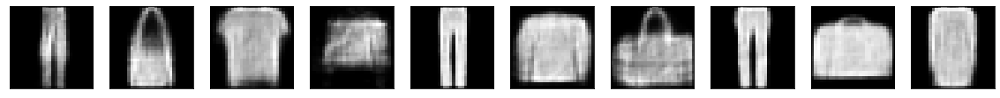

In [8]:
z = tf.random.normal((batch_size, latent_dim))
out = model.decode(z)  # Sigmoid로 디코드
out = tf.reshape(out, [-1, 28, 28]).numpy() * 255
out = out.astype(np.uint8)

number = 10
plt.figure(figsize=(20, 4))
for index in range(number):
    ax = plt.subplot(2, number, index + 1)
    plt.imshow(out[index], cmap='gray')
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()